# Part 1 A

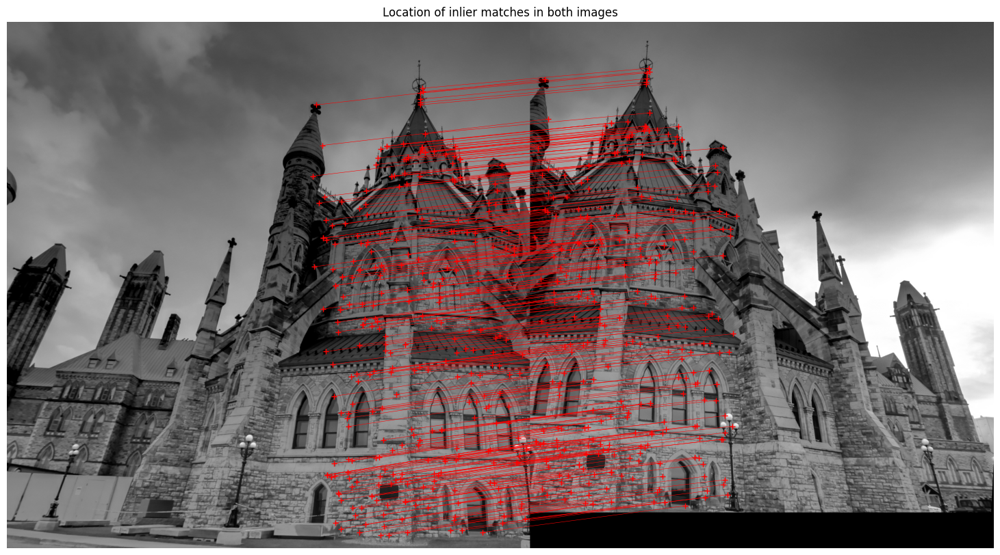

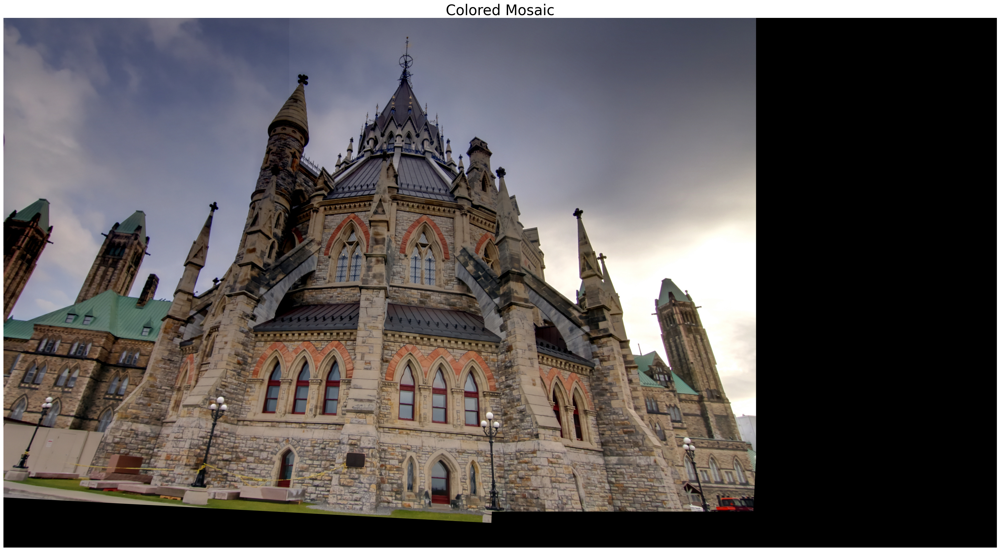

In [59]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
import scipy
from scipy.spatial import distance
import skimage
from skimage import transform

# Provided code for plotting inlier matches between two images
def plot_inlier_matches(ax, img1, img2, inliers):
    """
    Plot the matches between two images according to the matched keypoints
    :param ax: plot handle
    :param img1: left image
    :param img2: right image
    :inliers: x,y in the first image and x,y in the second image (Nx4)
    """
    res = np.hstack([img1, img2])
    ax.set_aspect('equal')
    ax.imshow(res, cmap='gray')
    
    ax.plot(inliers[:,0], inliers[:,1], '+r')
    ax.plot(inliers[:,2] + img1.shape[1], inliers[:,3], '+r')
    ax.plot([inliers[:,0], inliers[:,2] + img1.shape[1]],
            [inliers[:,1], inliers[:,3]], 'r', linewidth=0.4)
    ax.axis('off')
    

# Preprocessing
img1 = cv.imread('parliament-left.jpg') # shape is (h,w,c)
img2 = cv.imread('parliament-right.jpg')

img1_grey = cv.cvtColor(img1,cv.COLOR_BGR2GRAY)
img2_grey = cv.cvtColor(img2,cv.COLOR_BGR2GRAY)

# Detect keypoints and extract descriptors
sift = cv.SIFT_create()
kp_img1, des1 = sift.detectAndCompute(img1_grey,None)
kp_img2, des2 = sift.detectAndCompute(img2_grey,None)

# Matching by computing the squared Euclidean distance between every SIFT descriptor in img1 and descriptors from img2
eucli_dist = distance.cdist(des1, des2, 'sqeuclidean') # 2d matrix where rows are keypoints of img1 and cols are keypoints of img2

# Prune features based on top N smallest pairwise distance
N = 300 
sorted_rows = np.argsort(eucli_dist.min(axis=1)) # Find smallest distances for each row, sort them, and store them by their indices
top_n_rows = sorted_rows[:N] 
best_match_indices = eucli_dist.argmin(axis=1) # Index list of best matches for each keypoint in img1
top_n_cols = best_match_indices[top_n_rows] # Retrieves corresponding img2 keypoints indices from top n keypoints in img1

# Display location of inliers matches in both images
img1_points_coord = np.array([kp_img1[i].pt for i in top_n_rows]) # [N,2] shape where it stores x,y positions of points
img2_points_coord = np.array([kp_img2[i].pt for i in top_n_cols]) 

h1, w1 = img1_grey.shape
h2, w2 = img2_grey.shape

# Pad images to ensure height is the same for the inlier function (I added this because images provided for part A had different dimensions)
if h1 > h2:
    img2_padded = np.pad(img2_grey, ((0, h1 - h2), (0, 0)), mode='constant')
else:
    img1_padded = np.pad(img1_grey, ((0, h2 - h1), (0, 0)), mode='constant')

computed_inliers = np.hstack([img1_points_coord, img2_points_coord])

fig, ax = plt.subplots(figsize=(20,10))
plot_inlier_matches(ax, img1_padded, img2_padded, computed_inliers)
plt.title("Location of inlier matches in both images")
plt.show()

# Implement RANSAC to estimate an affine transformation that maps one image to the other
min_num_pairs = 3 # Minimum number of pairwise matches since we're solving for 6 unknowns in affine transformation

# Implement RANSAC loop to find the best iteration 
p = 0.2
n_iterations = 100
best_affine = None
inlier_best_count = 0
best_inlier_mask = None

for curr in range(n_iterations):
    # Choose 3 random samples from computed inliers and group all the first points together and all second points
    random_indices = np.random.choice(computed_inliers.shape[0], size=min_num_pairs, replace=False)
    sample = computed_inliers[random_indices]
    first_pts = sample[:, :2]
    second_pts = sample[:, 2:]
    
    # Solve for affine 6 unknown points using linear equations Ax = b
    b = np.zeros(6) # second points in a 6x1 vector
    A = np.zeros((2 * min_num_pairs,6))
    for i in range(min_num_pairs):
        x,y = first_pts[i]

        A[2 * i] = [x, y, 1, 0, 0, 0] # vector used to mutiple with unknown coefficients -> xa + yb + 1(c) = x'
        A[2 * i + 1] = [0, 0, 0, x, y, 1] # vector used to multiple with unknow coefficients -> xd + ye + f = y'
    
        # Fill in b
        x_2, y_2 = second_pts[i]
        b[2 * i] = x_2
        b[2 * i + 1] = y_2
        
    # Solve for x using x = A^-1 * b 
    try:
        x = np.linalg.solve(A, b)
    except np.linalg.LinAlgError: 
        # matrix A is not invertible due to all 3 points being collinear or we resampled two or more similar points
        # print(f"Matrix A is not invertible, degenerate sample {A}")
        continue
    affine = x.reshape(2,3)
    
    # RANSAC Inlier counting
    ones = np.ones((img1_points_coord.shape[0], 1))
    homogeneous_img1_points = np.hstack([img1_points_coord, ones]) # Shape is now N x 3
    # Apply affine transformation to all keypoints in image 1 via dot product vectorization
    new_img1_points = affine @ homogeneous_img1_points.T # shape is now 2 x N
    
    # Calculate the distances between estimates keypoints and actual keypoints of image 2 and count inliers
    diff_coord = new_img1_points - img2_points_coord.T
    distances = np.linalg.norm(diff_coord, axis=0)
    inlier_mask = (distances < p)
    inlier_count = inlier_mask.sum()

    # Compare with best and update accordingly
    if inlier_count > inlier_best_count:
        inlier_best_count = inlier_count
        best_affine = affine
        best_inlier_mask = inlier_mask

# print(f"Inliers: {inlier_best_count} / {N}")

# Compute optimal transformation 
A = np.zeros((2 * inlier_best_count, 6)) # A matrix for all inliers
b = np.zeros(2 * inlier_best_count)

# Get all inliers from image 1 and image 2 using the best model found
inliers_img1 = img1_points_coord[best_inlier_mask]
inliers_img2 = img2_points_coord[best_inlier_mask]

# Fill A
zeros = np.zeros(inlier_best_count)
ones = np.ones(inlier_best_count)
pts_x_img1 = inliers_img1[:, 0]
pts_y_img1 = inliers_img1[:, 1]
pts_x_img2 = inliers_img2[:, 0]
pts_y_img2 = inliers_img2[:, 1]
A[0::2] = np.column_stack((pts_x_img1, pts_y_img1, ones, zeros, zeros, zeros)) # vector used to mutiple with unknown coefficients -> xa + yb + 1(c) = x'
A[1::2] = np.column_stack((zeros, zeros, zeros, pts_x_img1, pts_y_img1, ones)) # vector used to multiple with unknow coefficients -> xd + ye + f = y'

# Fill b
b[0::2] = pts_x_img2
b[1::2] = pts_y_img2

# Compute final affine transformation using least squares 
x = np.linalg.solve(A.T @ A, A.T @ b)
affine_final = x.reshape(2,3)

# Create panorama
img1_rgb = cv.cvtColor(img1, cv.COLOR_BGR2RGB)
img2_rgb = cv.cvtColor(img2, cv.COLOR_BGR2RGB)

h1,w1 = img1_rgb.shape[:2]
h2,w2 = img2_rgb.shape[:2]

offset = abs(int(affine_final[0, 2])) # Used to horizontally align warped image 1 to left of canvas, ensuring it stays within canvas bounds
out_shape = (max(h1, h2), max(w1 + w2, offset + w2), 3) # height, width, channels
homogeneous_affine = np.vstack([affine_final, [0,0,1]])
homogeneous_affine[0, 2] += offset  

# Warp image 1
tform = transform.ProjectiveTransform(homogeneous_affine) # Inverse transformation
warped_img1 = transform.warp(image=img1_rgb, inverse_map=tform.inverse, output_shape=out_shape, # Returned in normalized form
                        order=1)

# Create empty canvas and place image 2 in correct position
canvas = np.zeros(out_shape)
canvas[:h2, offset:offset + w2] = img2_rgb / 255.0 

# Composite the 2 images (Revert normalization to get the original pixel values) 
mosaic = (np.maximum(warped_img1, canvas) * 255).astype(np.uint8)

# Disply mosaic
plt.figure(figsize=(40, 20))
plt.imshow(mosaic)
plt.axis('off')
plt.title("Colored Mosaic", fontsize=30)
plt.show()







# Part 1 B

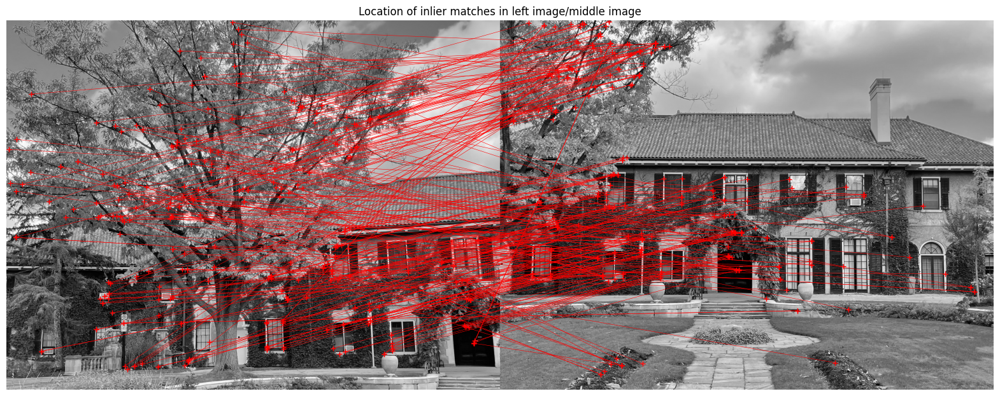

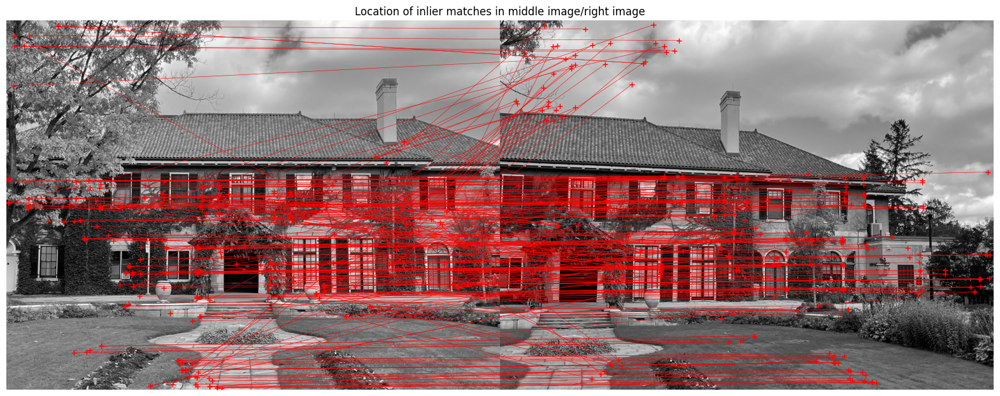

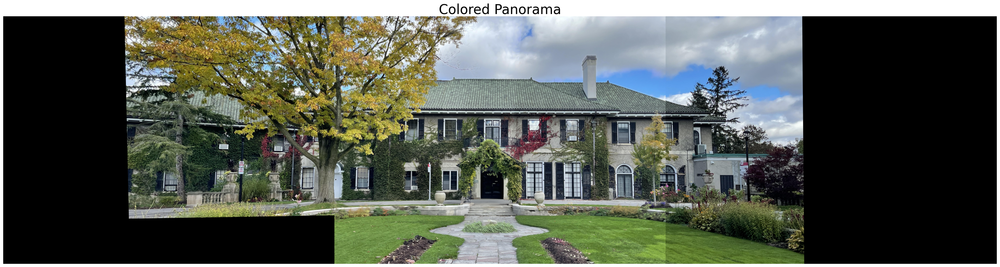

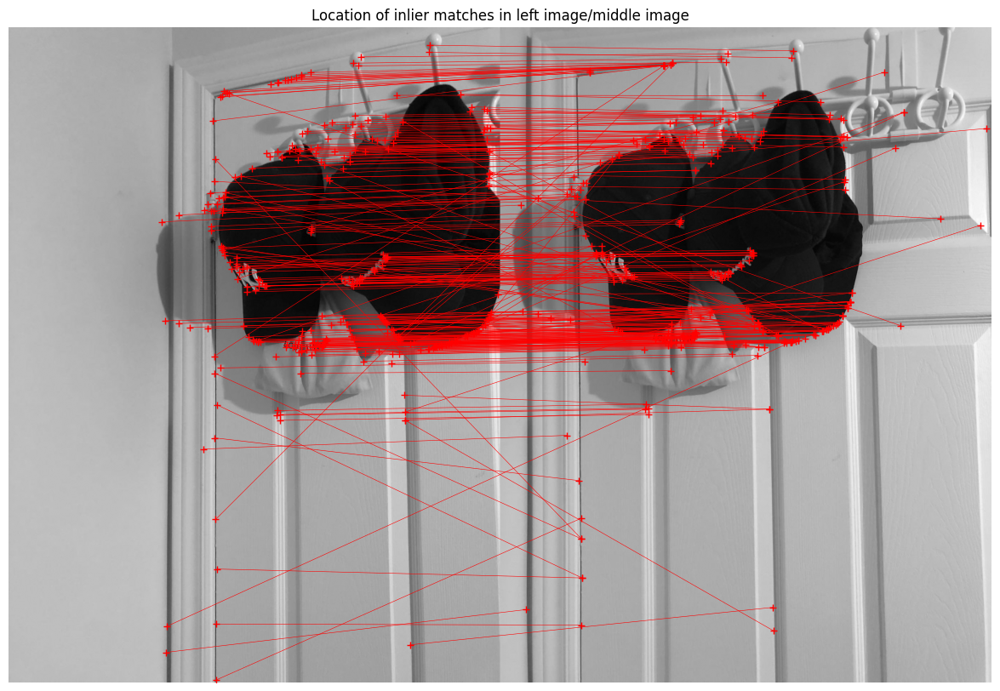

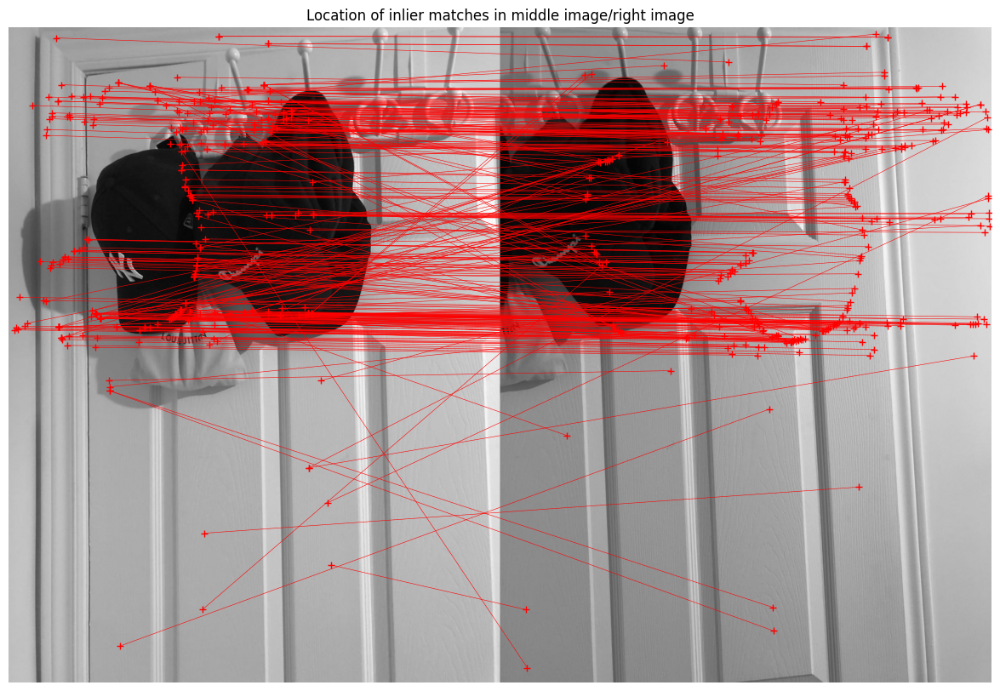

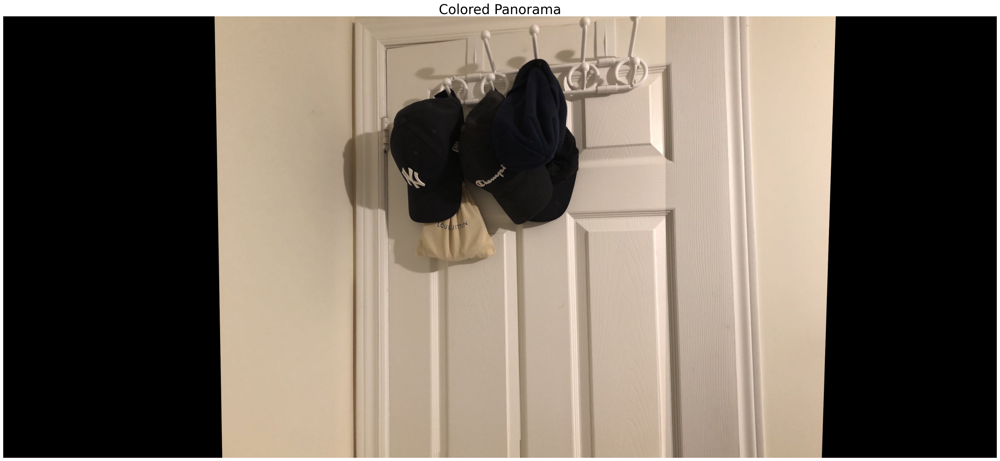

In [61]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
import scipy
from scipy.spatial import distance
import skimage
from skimage import transform

def create_panorama_homography(img1, img2, img3):
    # Provided code for plotting inlier matches between two images
    def plot_inlier_matches(ax, img1, img2, inliers):
        """
        Plot the matches between two images according to the matched keypoints
        :param ax: plot handle
        :param img1: left image
        :param img2: right image
        :inliers: x,y in the first image and x,y in the second image (Nx4)
        """
        res = np.hstack([img1, img2])
        ax.set_aspect('equal')
        ax.imshow(res, cmap='gray')
        
        ax.plot(inliers[:,0], inliers[:,1], '+r')
        ax.plot(inliers[:,2] + img1.shape[1], inliers[:,3], '+r')
        ax.plot([inliers[:,0], inliers[:,2] + img1.shape[1]],
                [inliers[:,1], inliers[:,3]], 'r', linewidth=0.4)
        ax.axis('off')
    
    img1_grey = cv.cvtColor(img1,cv.COLOR_BGR2GRAY)
    img2_grey = cv.cvtColor(img2,cv.COLOR_BGR2GRAY)
    img3_grey = cv.cvtColor(img3,cv.COLOR_BGR2GRAY)
    
    # Detect keypoints and extract descriptors
    sift = cv.SIFT_create(nfeatures=1000)
    kp_img1, des1 = sift.detectAndCompute(img1_grey,None)
    kp_img2, des2 = sift.detectAndCompute(img2_grey,None)
    kp_img3, des3 = sift.detectAndCompute(img3_grey,None)
    
    # Matching by computing the squared Euclidean distance between every SIFT descriptor in all 3 images
    eucli_dist_left_mid = distance.cdist(des1, des2, 'sqeuclidean') 
    eucli_dist_mid_right = distance.cdist(des2, des3, 'sqeuclidean') 
    
    N = 300 # Top 300 smallest pairwise distances
    
    # Left-Middle pruning
    sorted_rows_lm = np.argsort(eucli_dist_left_mid.min(axis=1)) # Find smallest distances for each row, sort them, and store them by their indices
    top_n_rows_lm = sorted_rows_lm[:N] 
    best_match_indices_lm = eucli_dist_left_mid.argmin(axis=1) # Index list of best matches for each keypoint in img1
    top_n_cols_lm = best_match_indices_lm[top_n_rows_lm] # Retrieves corresponding img2 keypoints indices from top n keypoints in img1
    
    # Middle-Right pruning
    sorted_rows_mr = np.argsort(eucli_dist_mid_right.min(axis=1)) 
    top_n_rows_mr = sorted_rows_mr[:N] 
    best_match_indices_mr = eucli_dist_mid_right.argmin(axis=1) # Index list of best matches for each keypoint in img2
    top_n_cols_mr = best_match_indices_mr[top_n_rows_mr] # Retrieves corresponding img3 keypoints indices from top n keypoints in img2
    
    # Extract point coordinates for left-middle pair and middle-right pair. Shape is [N,2] for each
    left_points_coord = np.array([kp_img1[i].pt for i in top_n_rows_lm]) 
    mid_points_coord_lm = np.array([kp_img2[i].pt for i in top_n_cols_lm])
    
    right_points_coord = np.array([kp_img3[i].pt for i in top_n_cols_mr])
    mid_points_coord_mr = np.array([kp_img2[i].pt for i in top_n_rows_mr]) 
    
    # Display location of inliers matches for each image pairs
    computed_inliers_lm = np.hstack([left_points_coord, mid_points_coord_lm]) 
    computed_inliers_mr = np.hstack([right_points_coord, mid_points_coord_mr]) 
    
    # Left-Middle inlier display
    fig, ax = plt.subplots(figsize=(20,10))
    plot_inlier_matches(ax, img1_grey, img2_grey, computed_inliers_lm)
    plt.title("Location of inlier matches in left image/middle image")
    plt.show()
    
    # Middle-right inlier display
    fig, ax = plt.subplots(figsize=(20,10))
    plot_inlier_matches(ax, img2_grey, img3_grey, computed_inliers_mr)
    plt.title("Location of inlier matches in middle image/right image")
    plt.show()
    
    # Implement RANSAC to estimate an homography transformationr
    min_num_pairs = 4 # Minimum number of pairwise matches since we're solving for 8 unknowns
    
    # Pre-cond: img1_points_coord and img2_points_coord contains the top 300 optimal keypoints, p and n_iterations are pre-defined
    # Post-cond: returns the best homography that minimizes |Ax| and inliers within p
    def create_ransac(p, n_iterations, computed_inliers, img1_points_coord, img2_points_coord):  
        best_h = None
        inlier_best_count = 0
        best_inlier_mask = None
        
        for curr in range(n_iterations):
            # Choose 3 random samples from computed inliers and group all the first points together and all second points
            random_indices = np.random.choice(computed_inliers.shape[0], size=min_num_pairs, replace=False)
            sample = computed_inliers[random_indices]
            first_pts = sample[:, :2]
            second_pts = sample[:, 2:]
            
            # Create A Matrix, which is a 8x9
            A = np.zeros((2 * min_num_pairs, 9))
            for i in range(min_num_pairs):
                x_in,y_in = first_pts[i]
                x_out,y_out = second_pts[i]
                
                A[2 * i] = [x_in, y_in, 1, 0, 0, 0, -x_out * x_in,
                            -x_out * y_in, -x_out] 
                A[2 * i + 1] = [0, 0, 0, x_in, y_in, 1, -y_out * x_in,
                               -y_out * y_in, -y_out] 
    
            # Compute the homography matrix that minimizes ||Ax|| 
            U, S, V = np.linalg.svd(A)
            solution = V[len(V)-1] 
            h = solution.reshape(3,3) 
    
            # Apply homography to all keypoints in image 1 
            ones = np.ones((img1_points_coord.shape[0], 1))
            homogeneous_pts1 = np.hstack([img1_points_coord, ones]) # Shape is now N x 3
            new_img1_points = h @ homogeneous_pts1.T # shape is now 3 x N
            new_img1_points = new_img1_points[:2] / new_img1_points[2] # Apply homogeneous division
    
            # Calculate the distances between estimates keypoints and actual keypoints of image 2
            diff_coord = new_img1_points - img2_points_coord.T
            distances = np.linalg.norm(diff_coord, axis=0)
            inlier_mask = (distances < p)
            inlier_count = inlier_mask.sum()
        
            # Compare with best and update accordingly
            if inlier_count > inlier_best_count:
                inlier_best_count = inlier_count
                best_h = h
                best_inlier_mask = inlier_mask
        return best_h, inlier_best_count, best_inlier_mask
    
    # Create ransac for image pairs
    p = 5
    n_iterations = 1000
    best_h_lm, inlier_best_count_lm, best_inlier_mask_lm = create_ransac(p, n_iterations, computed_inliers_lm, left_points_coord, mid_points_coord_lm)
    best_h_mr, inlier_best_count_mr, best_inlier_mask_mr = create_ransac(p, n_iterations, computed_inliers_mr, right_points_coord, mid_points_coord_mr)
    
    # Pre-cond: Takes the inliers of two images
    # Post-cond: returns optimal homography 
    def compute_optimal_homography(inliers_img1, inliers_img2, inlier_best_count): 
        A = np.zeros((2 * inlier_best_count, 9))
        zeros = np.zeros(inlier_best_count)
        ones = np.ones(inlier_best_count)
    
        # Retrieve the x and y components for each inlier in image 1 and image 2
        x_in = inliers_img1[:, 0]
        y_in = inliers_img1[:, 1]
        x_out = inliers_img2[:, 0]
        y_out = inliers_img2[:, 1]
    
        # Fill A, with even rows for x component and odd rows for y
        A[0::2] = np.column_stack((x_in, y_in, ones, zeros, zeros, zeros, -x_out * x_in, -x_out * y_in, -x_out)) 
        A[1::2] = np.column_stack((zeros, zeros, zeros, x_in, y_in, ones, -y_out * x_in, -y_out * y_in, -y_out)) 
        
        # Compute final homography transformation using least squares 
        U, S, V = np.linalg.svd(A)
        solution = V[len(V)-1] 
        h = solution.reshape(3,3) 
        
        return h
    
    # Get Left-middle inliers
    inliers_left = left_points_coord[best_inlier_mask_lm]
    inliers_mid_lm = mid_points_coord_lm[best_inlier_mask_lm]
    
    # Get Middle-Right inliers
    inliers_right = right_points_coord[best_inlier_mask_mr]
    inliers_mid_mr = mid_points_coord_mr[best_inlier_mask_mr]
    
    # Compute the optimal homography for all inliers 
    h_lm = compute_optimal_homography(inliers_left, inliers_mid_lm, inlier_best_count_lm)
    h_mr = compute_optimal_homography(inliers_right, inliers_mid_mr, inlier_best_count_mr)
    
    # Create panorama
    img1_rgb = cv.cvtColor(img1, cv.COLOR_BGR2RGB)
    img2_rgb = cv.cvtColor(img2, cv.COLOR_BGR2RGB)
    img3_rgb = cv.cvtColor(img3, cv.COLOR_BGR2RGB)
    
    h1,w1 = img1_rgb.shape[:2]
    h2,w2 = img2_rgb.shape[:2]
    h3,w3 = img3_rgb.shape[:2]
    
    out_shape = (max(h1, h2, h3), w1 + w2 + w3, 3) # shape of canvas
    
    # Apply offsets to homograph matrices
    offset = w1  # Used to shift the panorama so middle image appears at center of canvas
    T = np.array([[1, 0, offset], # 3x3 translation matrix
                  [0, 1, 0],
                  [0, 0, 1]], dtype=np.float64)
    
    # Factor out constant h9
    h_lm_normalize = h_lm / h_lm[2, 2] 
    h_mr_normalize = h_mr / h_mr[2, 2]
    
    h_lm = T @ h_lm_normalize
    h_mr = T @ h_mr_normalize
    
    # Warp the left and right images
    tform_lm = transform.ProjectiveTransform(h_lm) 
    tform_mr = transform.ProjectiveTransform(h_mr) 
    
    warped_left = transform.warp(image=img1_rgb, inverse_map=tform_lm.inverse, output_shape=out_shape, 
                            order=1)
    warped_right = transform.warp(image=img3_rgb, inverse_map=tform_mr.inverse, output_shape=out_shape, 
                            order=1)
    
    # Place middle
    canvas = np.zeros(out_shape)
    canvas[:h2, offset:offset + w2] = img2_rgb / 255.0 # Fill the empty canvas with image 2 
    
    # Composite the 3 images
    mosaic = np.maximum(warped_left, warped_right)
    mosaic = np.maximum(mosaic, canvas)
    mosaic = (mosaic * 255).astype(np.uint8)
    
    # Display mosaic
    plt.figure(figsize=(40, 20))
    plt.imshow(mosaic)
    plt.axis('off')
    plt.title("Colored Panorama", fontsize=30)
    plt.show()

# Preprocessing
img1 = cv.imread('Glendon-Hall-left.jpg') # shape is (h,w,c)
img2 = cv.imread('Glendon-Hall-middle.jpg')
img3 = cv.imread('Glendon-Hall-right.jpg')

# My own images for testing
img4 = cv.imread('test-left.jpg') # shape is (h,w,c)
img5 = cv.imread('test-middle.jpg')
img6 = cv.imread('test-right.jpg')

# Create panorama for provided images and my own images
create_panorama_homography(img1, img2, img3)
create_panorama_homography(img4, img5, img6)


